## Porcentajes y mas informacion de los graficos del punto 3 

Este notebook usa en su mayoria el codigo de "Proyecto_final" y añade a los graficos del punto 3 que aparezcan los datos, los porcentajes y valor y ordenados de mayor a menor

# 1. Importacion de librerias y carga de datos 

In [1]:
# Importamos pandas, numpy, seaborn, random y plotly:

import pandas as pd
import numpy as np
import seaborn as sns
import random
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from itertools import combinations, chain

In [2]:
df_compas_raw = pd.read_csv("https://raw.githubusercontent.com/MangelFdz/nuclio_g3_bias/13a4a83170a1103c7e32a9a5f46a819db8c5b7d5/users/Emilio/compas-scores-raw.csv", delimiter=',')
df_compas_2y = pd.read_csv("https://raw.githubusercontent.com/MangelFdz/nuclio_g3_bias/13a4a83170a1103c7e32a9a5f46a819db8c5b7d5/users/Emilio/compas-scores-two-years.csv", delimiter=',')


In [3]:
df_compas_raw_transpose = df_compas_raw.transpose()
df_compas_raw_transpose

,0,1,2,3,4,5,6,7,8,9,...,60833,60834,60835,60836,60837,60838,60839,60840,60841,60842
Person_ID,50844,50844,50844,50848,50848,50848,50855,50855,50855,50850,...,19968,68598,68598,68598,65667,65667,65667,68603,68603,68603
AssessmentID,57167,57167,57167,57174,57174,57174,57181,57181,57181,57176,...,39866,79660,79660,79660,79665,79665,79665,79669,79669,79669
Case_ID,51950,51950,51950,51956,51956,51956,51963,51963,51963,51958,...,36500,72035,72035,72035,72038,72038,72038,72042,72042,72042
Agency_Text,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,...,PRETRIAL,PRETRIAL,PRETRIAL,PRETRIAL,Probation,Probation,Probation,PRETRIAL,PRETRIAL,PRETRIAL
LastName,Fisher,Fisher,Fisher,KENDALL,KENDALL,KENDALL,DAYES,DAYES,DAYES,Debe,...,BUTTERFIELD,SUAREZ,SUAREZ,SUAREZ,West,West,West,Ryan,Ryan,Ryan
FirstName,Kevin,Kevin,Kevin,KEVIN,KEVIN,KEVIN,DANIEL,DANIEL,DANIEL,Mikerlie,...,JAMES,ANDERSON,ANDERSON,ANDERSON,James,James,James,Michael,Michael,Michael
MiddleName,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,George,...,MICHAEL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sex_Code_Text,Male,Male,Male,Male,Male,Male,Male,Male,Male,Female,...,Male,Male,Male,Male,Male,Male,Male,Male,Male,Male
Ethnic_Code_Text,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,Caucasian,African-American,African-American,African-American,African-American,...,Caucasian,Caucasian,Caucasian,Caucasian,African-American,African-American,African-American,Caucasian,Caucasian,Caucasian
DateOfBirth,12/05/92,12/05/92,12/05/92,09/16/84,09/16/84,09/16/84,08/25/94,08/25/94,08/25/94,10/09/94,...,09/24/73,08/10/81,08/10/81,08/10/81,06/21/64,06/21/64,06/21/64,02/06/85,02/06/85,02/06/85


========================================================================================================================

# 2. Limpieza y Procesamiento de Datos

In [4]:
# Cantidad de valores duplicados en el dataset:
valores_duplicados = df_compas_raw.duplicated().sum()
print("Valores duplicados del dataset:", valores_duplicados)

Valores duplicados del dataset: 0


In [5]:
# Contar la cantidad de evaluaciones por cada Person_ID
person_id_counts = df_compas_raw['Person_ID'].value_counts()

# Resumir cuántas personas tienen múltiples registros
multiple_evaluations_summary = person_id_counts.value_counts()

# Mostrar el resumen de evaluaciones
print("Cantidad de personas con diferentes números de evaluaciones:")
print(multiple_evaluations_summary)

# Describir estadísticamente la distribución de evaluaciones por persona
print("\nDescripción estadística de la cantidad de evaluaciones por persona:")
print(person_id_counts.describe())

Cantidad de personas con diferentes números de evaluaciones:
count
3     17077
6      1411
9       106
12       16
Name: count, dtype: int64

Descripción estadística de la cantidad de evaluaciones por persona:
count    18610.000000
mean         3.269371
std          0.940507
min          3.000000
25%          3.000000
50%          3.000000
75%          3.000000
max         12.000000
Name: count, dtype: float64


In [6]:
# Procedemos a limpiar los datos del primer dataset, ya que hay muchos IDs (personas) duplicados, al haber diferentes puntuaciones diferentes
# a la de reincidencia para cada uno de los IDs, descritos en la columna "DisplayText". Nos quedaremos solo con los que hacen referencia a la reincidencia
# (Risk of Recidivism).

print(df_compas_raw["DisplayText"].unique())
df_compas_raw_risk = df_compas_raw[df_compas_raw['DisplayText'] == 'Risk of Recidivism']
df_compas_raw_solo_recidivism = (60843/3)
print (f'el número de filas si nos quedamos solo con Risk of Recidivism debería ser {df_compas_raw_solo_recidivism}')
print (f'el número de filas total real que nos queda en el dataframes, y de las columnas, es: {df_compas_raw_risk.shape}')

['Risk of Violence' 'Risk of Recidivism' 'Risk of Failure to Appear']
el número de filas si nos quedamos solo con Risk of Recidivism debería ser 20281.0
el número de filas total real que nos queda en el dataframes, y de las columnas, es: (20281, 28)


In [7]:
df_compas_raw_risk['Person_ID'].nunique()
#comprobamos que siguen habiendo personas, o IDs de persona, que siguen estando duplicados. 
# Procedemos a analizar esos duplicados.

18610

In [8]:
df_compas_raw_risk_of_reicidivism = df_compas_raw_risk[df_compas_raw_risk['Person_ID'].duplicated(keep=False)]

# Contar la cantidad de veces que aparece cada 'Person_ID'
count_per_id = df_compas_raw_risk_of_reicidivism['Person_ID'].value_counts()

# Contar cuántos 'Person_ID' tienen cada número de apariciones
count_duplicates = count_per_id.value_counts()

# Mostrar el resultado
print(count_duplicates)

print(f"El total de entradas del dataframes filtrado con Person_ID duplicados es: {len(df_compas_raw_risk_of_reicidivism)}")
print(df_compas_raw_risk_of_reicidivism)

count
2    1411
3     106
4      16
Name: count, dtype: int64
El total de entradas del dataframes filtrado con Person_ID duplicados es: 3204
       Person_ID  AssessmentID  Case_ID Agency_Text     LastName FirstName  \
28         50842         57165    51948    PRETRIAL     Mulligan   William   
31         50843         57166    51949    PRETRIAL        Davis   Michael   
79         50875         57206    51987   Probation         renz    daniel   
85         31285         57205    51986    PRETRIAL      deutsch   zackery   
100        50866         57194    51976    PRETRIAL       SCHWAB      GARY   
...          ...           ...      ...         ...          ...       ...   
60814      34047         79654    33181    PRETRIAL        Lewis      Kurt   
60817      44498         79672    45849    PRETRIAL    Breedlove    Leotis   
60823      19968         79664    36500    PRETRIAL  BUTTERFIELD     JAMES   
60832      19968         39866    36500    PRETRIAL  BUTTERFIELD     JAMES   
6

<span style="color: yellow; font-size: 25px;">Aquí habría que ver cuál es el motivo de ID duplicados y hacer un último filtro para dejar IDs únicos (última fecha de screening, por ejemplo)</span>

# 3. Análisis Exploratorio de Datos (EDA)

#### 3.1.1. Distribución por género

In [9]:
# Este es el codigo que esta en el notebook 

grouped_by_way = df_compas_raw_risk_of_reicidivism.groupby('Person_ID').agg({
    'Sex_Code_Text': 'first',
    'Ethnic_Code_Text': 'first'
})

grouped_by_way

,Sex_Code_Text,Ethnic_Code_Text
Person_ID,,
793,Male,Caucasian
866,Female,African-American
875,Male,Caucasian
949,Female,African-American
1172,Male,African-American
...,...,...
67982,Male,Caucasian
68362,Male,Native American
68381,Male,Caucasian


In [10]:
# este es el grafico que esta en el notebook 
figura2 = px.bar(df_compas_raw_risk_of_reicidivism, 
             x='Sex_Code_Text', 
             title='Distribución por Género', 
             labels={'Sex_Code_Text': 'Género'},
             color='Sex_Code_Text'
             )  # Agrega color para mayor diferenciación

# Mostrar el gráfico
figura2.show()


In [11]:
# con este codigo tambien podemos ver los porcentajes 

grouped_by_way = df_compas_raw_risk_of_reicidivism.groupby('Person_ID').agg({
    'Sex_Code_Text': 'first',
    'Ethnic_Code_Text': 'first'
})

# Calcular la distribución y porcentaje para 'Sex_Code_Text'
sex_distribution = grouped_by_way['Sex_Code_Text'].value_counts()
sex_percentage = (sex_distribution / sex_distribution.sum()) * 100

# Creacion del texto
for sex, count in sex_distribution.items():
    percentage = sex_percentage[sex]
    print(f"Existen {count} {sex.lower()} que representan {percentage:.2f}%")

# Calcular la distribución y porcentaje para 'Ethnic_Code_Text'
ethnic_distribution = grouped_by_way['Ethnic_Code_Text'].value_counts()
ethnic_percentage = (ethnic_distribution / ethnic_distribution.sum()) * 100

# Creacion del texto
for ethnicity, count in ethnic_distribution.items():
    percentage = ethnic_percentage[ethnicity]
    print(f"Existen {count} personas de etnicidad {ethnicity.lower()} que representan {percentage:.2f}%")


Existen 1274 male que representan 83.11%
Existen 259 female que representan 16.89%
Existen 809 personas de etnicidad african-american que representan 52.77%
Existen 485 personas de etnicidad caucasian que representan 31.64%
Existen 172 personas de etnicidad hispanic que representan 11.22%
Existen 53 personas de etnicidad other que representan 3.46%
Existen 7 personas de etnicidad native american que representan 0.46%
Existen 4 personas de etnicidad asian que representan 0.26%
Existen 3 personas de etnicidad african-am que representan 0.20%


#### 3.1.2. Distribución por raza

In [12]:
# este es el codigo que esta en el notebook 
grouped_by_race = df_compas_raw_risk_of_reicidivism.groupby('Person_ID').agg({
    'Ethnic_Code_Text': 'first'
})
# Contar la distribución por etnia
ethnicity_distribution = grouped_by_race['Ethnic_Code_Text'].value_counts()
print(ethnicity_distribution)
print(ethnicity_distribution.sum())
# Crear un gráfico de barras interactivo con Plotly Express
figura3 = px.bar(grouped_by_race, 
             x='Ethnic_Code_Text', 
             title='Distribución por Raza Agrupando ID', 
             labels={'Ethnic_Code_Text': 'Ethnic'},
             color='Ethnic_Code_Text'
             )  # Agrega color para mayor diferenciación

# Personalizar el tooltip para mostrar la suma total de IDs
figura3.update_traces(
    hovertemplate='<br>Ethnic_Code_Text=%{x}<br>Total IDs=%{y}'
)
# Mostrar el gráfico
figura3.show()


Ethnic_Code_Text
African-American    809
Caucasian           485
Hispanic            172
Other                53
Native American       7
Asian                 4
African-Am            3
Name: count, dtype: int64
1533


In [13]:
# Con este codigo vemos tambien el porcentaje 

# Calcular la distribución y porcentaje para 'Ethnic_Code_Text'
ethnic_distribution = grouped_by_way['Ethnic_Code_Text'].value_counts()
ethnic_percentage = (ethnic_distribution / ethnic_distribution.sum()) * 100

# Creacion del texto
for ethnicity, count in ethnic_distribution.items():
    percentage = ethnic_percentage[ethnicity]
    print(f"Existen {count} personas de etnicidad {ethnicity.lower()} que representan {percentage:.2f}%")


Existen 809 personas de etnicidad african-american que representan 52.77%
Existen 485 personas de etnicidad caucasian que representan 31.64%
Existen 172 personas de etnicidad hispanic que representan 11.22%
Existen 53 personas de etnicidad other que representan 3.46%
Existen 7 personas de etnicidad native american que representan 0.46%
Existen 4 personas de etnicidad asian que representan 0.26%
Existen 3 personas de etnicidad african-am que representan 0.20%


#### 3.1.3. Distribución por edad (Falta definir/hacer)

#### 3.1.4. Distribución por Merital Status

In [14]:
# Este es el codigo que esta en el notebook 

# Agrupar por 'Person_ID' y tomar el primer valor de 'Sex_Code_Text' y 'Ethnic_Code_Text'
grouped_by_marital = df_compas_raw_risk_of_reicidivism.groupby('Person_ID').agg({
    'MaritalStatus': 'first'
})
# Contar la distribución por etnia
marital_distribution = grouped_by_marital['MaritalStatus'].value_counts()
print(marital_distribution)
print(marital_distribution.sum())

MaritalStatus
Single               1210
Married               147
Divorced               83
Separated              42
Significant Other      41
Widowed                 8
Unknown                 2
Name: count, dtype: int64
1533


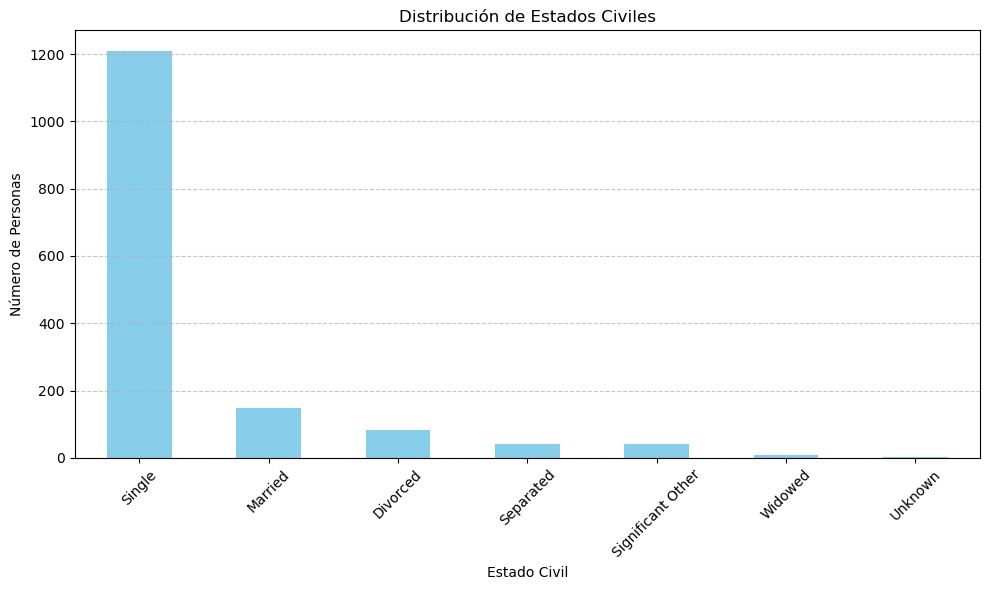

Existen 1210 personas con estado civil single que representan 78.93%
Existen 147 personas con estado civil married que representan 9.59%
Existen 83 personas con estado civil divorced que representan 5.41%
Existen 42 personas con estado civil separated que representan 2.74%
Existen 41 personas con estado civil significant other que representan 2.67%
Existen 8 personas con estado civil widowed que representan 0.52%
Existen 2 personas con estado civil unknown que representan 0.13%


In [15]:
# Con este codigo podemos ver el grafico, cuantos son y cuanto es el porcentaje 

# Agrupar por 'Person_ID' y tomar el primer valor de 'MaritalStatus'
grouped_by_marital_status = df_compas_raw_risk_of_reicidivism.groupby('Person_ID').agg({
    'MaritalStatus': 'first'
})

# Calcular la distribución y porcentaje para 'MaritalStatus'
marital_distribution = grouped_by_marital_status['MaritalStatus'].value_counts()
marital_percentage = (marital_distribution / marital_distribution.sum()) * 100

# Mostrar el gráfico de barras
plt.figure(figsize=(10, 6))
marital_distribution.plot(kind='bar', color='skyblue')
plt.title('Distribución de Estados Civiles')
plt.xlabel('Estado Civil')
plt.ylabel('Número de Personas')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Crear la salida de texto
for status, count in marital_distribution.items():
    percentage = marital_percentage[status]
    print(f"Existen {count} personas con estado civil {status.lower()} que representan {percentage:.2f}%")


#### 3.1.5. Distribución por ScoreText

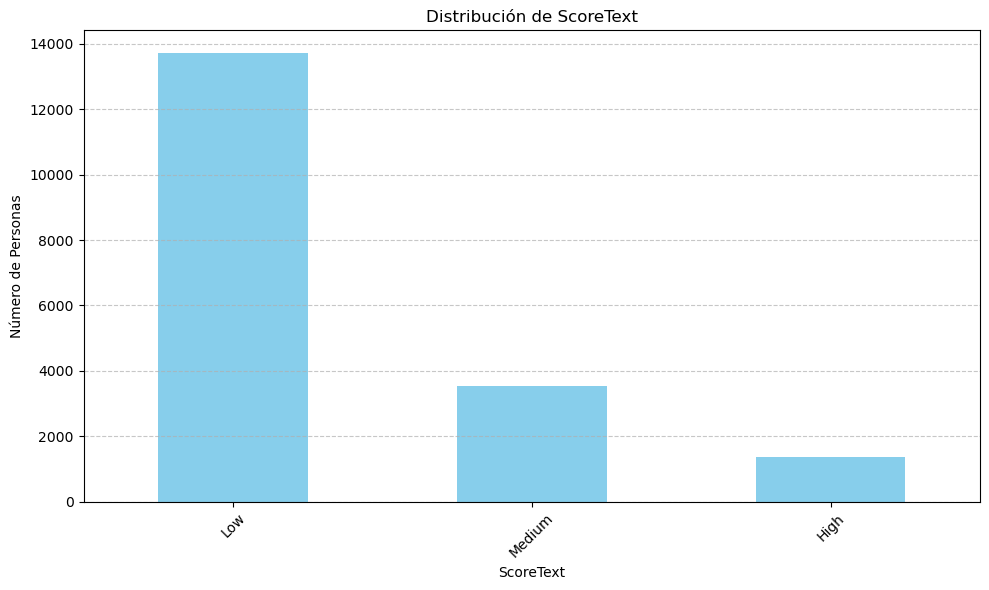

Existen 13728 registros con scoretext 'Low' que representan 73.77%
Existen 3522 registros con scoretext 'Medium' que representan 18.93%
Existen 1360 registros con scoretext 'High' que representan 7.31%


In [16]:
# Este codigo es para ver la distribucion de ScoreText
column_name = 'ScoreText'

# Agrupar por 'Person_ID' y tomar el primer valor de la columna deseada en df_compas_raw
grouped_by_column = df_compas_raw.groupby('Person_ID').agg({column_name: 'first'})

# Calcular la distribución y porcentaje para la columna deseada
distribution = grouped_by_column[column_name].value_counts()
percentage = (distribution / distribution.sum()) * 100

# Mostrar el gráfico de barras
plt.figure(figsize=(10, 6))
distribution.plot(kind='bar', color='skyblue')
plt.title(f'Distribución de {column_name}')
plt.xlabel(column_name)
plt.ylabel('Número de Personas')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

for value, count in distribution.items():
    perc = percentage[value]
    print(f"Existen {count} registros con {column_name.lower()} '{value}' que representan {perc:.2f}%")


In [17]:
# este codigo esta en el notebook 
figura2 = px.bar(df_compas_raw_risk_of_reicidivism, 
             x='Sex_Code_Text', 
             title='Distribución por Género', 
             labels={'Sex_Code_Text': 'Género'},
             color='Sex_Code_Text'
             )  # Agrega color para mayor diferenciación

# Mostrar el gráfico
figura2.show()

#### 3.1.4. Estadísticas Descriptivas y Visualización

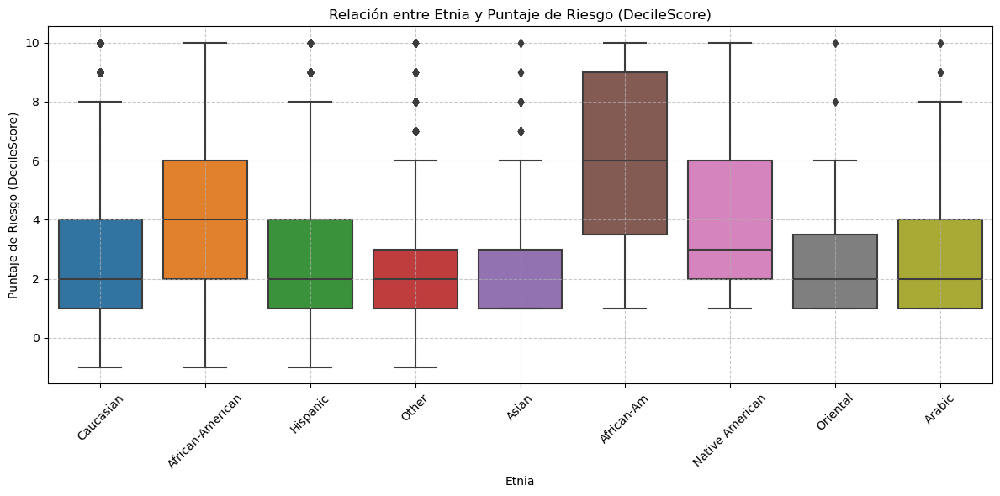


Distribución y porcentajes de la columna 'Ethnic_Code_Text':
Existen 27018 registros con etnia 'African-American' que representan 44.41%
Existen 21783 registros con etnia 'Caucasian' que representan 35.80%
Existen 8742 registros con etnia 'Hispanic' que representan 14.37%
Existen 2592 registros con etnia 'Other' que representan 4.26%
Existen 324 registros con etnia 'Asian' que representan 0.53%
Existen 219 registros con etnia 'Native American' que representan 0.36%
Existen 75 registros con etnia 'Arabic' que representan 0.12%
Existen 51 registros con etnia 'African-Am' que representan 0.08%
Existen 39 registros con etnia 'Oriental' que representan 0.06%


In [18]:

# Definir las columnas que quieres analizar
ethnic_column = 'Ethnic_Code_Text'
score_column = 'DecileScore'

# Calcular la distribución y porcentaje para cada grupo étnico
ethnic_distribution = df_compas_raw[ethnic_column].value_counts()
ethnic_percentage = (ethnic_distribution / ethnic_distribution.sum()) * 100

# Mostrar el gráfico de caja (boxplot)
plt.figure(figsize=(12, 6))
sns.boxplot(x=ethnic_column, y=score_column, data=df_compas_raw)
plt.title('Relación entre Etnia y Puntaje de Riesgo (DecileScore)')
plt.xlabel('Etnia')
plt.ylabel('Puntaje de Riesgo (DecileScore)')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Crear la salida de texto con porcentajes
print(f"\nDistribución y porcentajes de la columna '{ethnic_column}':")
for value, count in ethnic_distribution.items():
    perc = ethnic_percentage[value]
    print(f"Existen {count} registros con etnia '{value}' que representan {perc:.2f}%")


In [19]:

# Distribución y porcentajes de RawScore por Sexo
rawscore_sex_distribution = df_compas_raw.groupby('Sex_Code_Text')['RawScore'].describe()
print("Distribución y porcentajes de RawScore por Sexo:")
for sex in rawscore_sex_distribution.index:
    count = df_compas_raw[df_compas_raw['Sex_Code_Text'] == sex].shape[0]
    percentage = (count / df_compas_raw.shape[0]) * 100
    print(f"{sex}: {count} registros que representan {percentage:.2f}%")

# Boxplot interactivo de RawScore por Sexo
fig1 = px.box(df_compas_raw, 
              x='Sex_Code_Text', 
              y='RawScore', 
              title='Distribución de RawScore por Sexo')
fig1.show()

# Distribución y porcentajes de DecileScore por Sexo
decilescore_sex_distribution = df_compas_raw.groupby('Sex_Code_Text')['DecileScore'].describe()
print("Distribución y porcentajes de DecileScore por Sexo:")
for sex in decilescore_sex_distribution.index:
    count = df_compas_raw[df_compas_raw['Sex_Code_Text'] == sex].shape[0]
    percentage = (count / df_compas_raw.shape[0]) * 100
    print(f"{sex}: {count} registros que representan {percentage:.2f}%")

# Boxplot interactivo de DecileScore por Sexo
fig2 = px.box(df_compas_raw, 
              x='Sex_Code_Text', 
              y='DecileScore', 
              title='Distribución de DecileScore por Sexo')
fig2.show()


Distribución y porcentajes de RawScore por Sexo:
Female: 13329 registros que representan 21.91%
Male: 47514 registros que representan 78.09%


Distribución y porcentajes de DecileScore por Sexo:
Female: 13329 registros que representan 21.91%
Male: 47514 registros que representan 78.09%


In [20]:

# Distribución y porcentajes de RawScore por Etnia
ethnic_rawscore_distribution = df_compas_raw.groupby('Ethnic_Code_Text')['RawScore'].describe()
print("Distribución y porcentajes de RawScore por Etnia:")
for ethnic in ethnic_rawscore_distribution.index:
    count = df_compas_raw[df_compas_raw['Ethnic_Code_Text'] == ethnic].shape[0]
    percentage = (count / df_compas_raw.shape[0]) * 100
    print(f"{ethnic}: {count} registros que representan {percentage:.2f}%")

# Boxplot interactivo de RawScore por Etnia
fig3 = px.box(df_compas_raw, 
              x='Ethnic_Code_Text', 
              y='RawScore', 
              title='Distribución de RawScore por Etnia')
fig3.show()

# Distribución y porcentajes de DecileScore por Etnia
ethnic_decilescore_distribution = df_compas_raw.groupby('Ethnic_Code_Text')['DecileScore'].describe()
print("Distribución y porcentajes de DecileScore por Etnia:")
for ethnic in ethnic_decilescore_distribution.index:
    count = df_compas_raw[df_compas_raw['Ethnic_Code_Text'] == ethnic].shape[0]
    percentage = (count / df_compas_raw.shape[0]) * 100
    print(f"{ethnic}: {count} registros que representan {percentage:.2f}%")

# Boxplot interactivo de DecileScore por Etnia
fig4 = px.box(df_compas_raw, 
              x='Ethnic_Code_Text', 
              y='DecileScore', 
              title='Distribución de DecileScore por Etnia')
fig4.show()


Distribución y porcentajes de RawScore por Etnia:
African-Am: 51 registros que representan 0.08%
African-American: 27018 registros que representan 44.41%
Arabic: 75 registros que representan 0.12%
Asian: 324 registros que representan 0.53%
Caucasian: 21783 registros que representan 35.80%
Hispanic: 8742 registros que representan 14.37%
Native American: 219 registros que representan 0.36%
Oriental: 39 registros que representan 0.06%
Other: 2592 registros que representan 4.26%


Distribución y porcentajes de DecileScore por Etnia:
African-Am: 51 registros que representan 0.08%
African-American: 27018 registros que representan 44.41%
Arabic: 75 registros que representan 0.12%
Asian: 324 registros que representan 0.53%
Caucasian: 21783 registros que representan 35.80%
Hispanic: 8742 registros que representan 14.37%
Native American: 219 registros que representan 0.36%
Oriental: 39 registros que representan 0.06%
Other: 2592 registros que representan 4.26%


c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



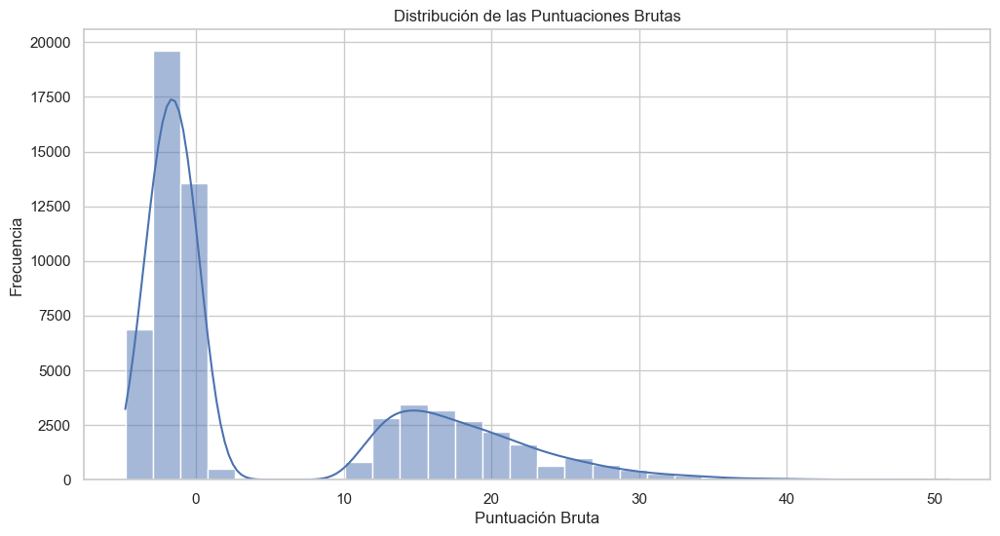

c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



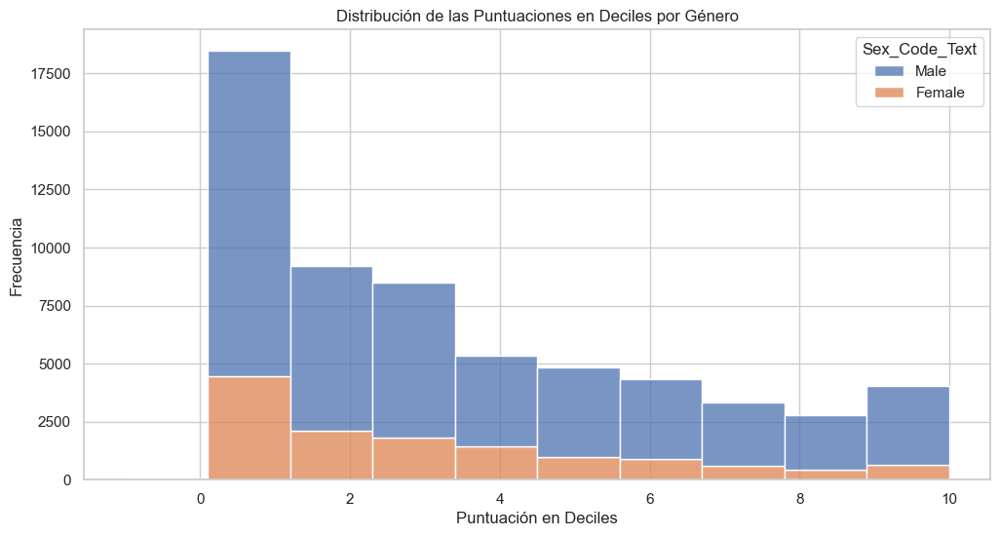

c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



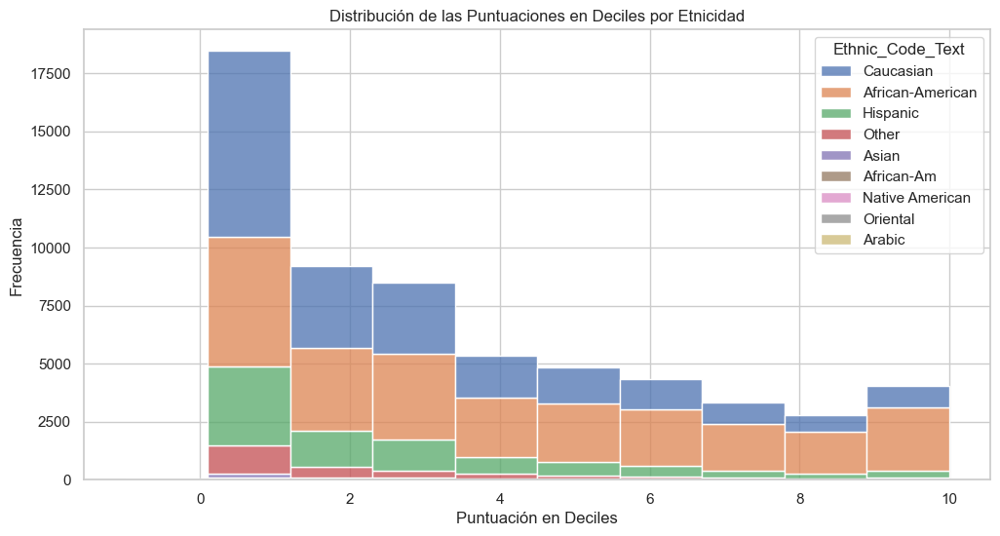

Distribución de RawScore:
count    659.000000
mean       0.151745
std        0.305711
min        0.001644
25%        0.050951
50%        0.118337
75%        0.164357
max        3.001167
Name: proportion, dtype: float64

Distribución de DecileScore por Género:
DecileScore         -1          1          2          3          4         5   \
Sex_Code_Text                                                                   
Female         0.075024  33.588416  15.740116  13.466877  10.698477  7.262360   
Male           0.073662  29.439744  14.930336  14.094793   8.233363  8.130235   

DecileScore          6         7         8         9         10  
Sex_Code_Text                                                    
Female         6.819716  4.546478  3.158527  3.038488  1.605522  
Male           7.176832  5.749884  5.004841  4.169297  2.997011  

Distribución de DecileScore por Etnicidad:
DecileScore            -1          1          2          3          4   \
Ethnic_Code_Text                 

In [21]:


# Configuración de estilo de Seaborn
sns.set(style="whitegrid")

# Distribución de las puntuaciones brutas (RawScore)
plt.figure(figsize=(12, 6))
sns.histplot(df_compas_raw['RawScore'], kde=True, bins=30)
plt.title('Distribución de las Puntuaciones Brutas')
plt.xlabel('Puntuación Bruta')
plt.ylabel('Frecuencia')
plt.show()

# Distribución de las puntuaciones en deciles (DecileScore) por género
plt.figure(figsize=(12, 6))
sns.histplot(df_compas_raw, x='DecileScore', hue='Sex_Code_Text', multiple='stack', bins=10)
plt.title('Distribución de las Puntuaciones en Deciles por Género')
plt.xlabel('Puntuación en Deciles')
plt.ylabel('Frecuencia')
plt.show()

# Distribución de las puntuaciones en deciles por etnicidad
plt.figure(figsize=(12, 6))
sns.histplot(df_compas_raw, x='DecileScore', hue='Ethnic_Code_Text', multiple='stack', bins=10)
plt.title('Distribución de las Puntuaciones en Deciles por Etnicidad')
plt.xlabel('Puntuación en Deciles')
plt.ylabel('Frecuencia')
plt.show()

# Calcula y muestra los porcentajes de distribución para RawScore
rawscore_distribution = df_compas_raw['RawScore'].value_counts(normalize=True) * 100
print("Distribución de RawScore:")
print(rawscore_distribution.describe())

# Calcula y muestra los porcentajes de distribución para DecileScore por género
decilescore_gender_distribution = df_compas_raw.groupby('Sex_Code_Text')['DecileScore'].value_counts(normalize=True).unstack().fillna(0) * 100
print("\nDistribución de DecileScore por Género:")
print(decilescore_gender_distribution)

# Calcula y muestra los porcentajes de distribución para DecileScore por etnicidad
decilescore_ethnicity_distribution = df_compas_raw.groupby('Ethnic_Code_Text')['DecileScore'].value_counts(normalize=True).unstack().fillna(0) * 100
print("\nDistribución de DecileScore por Etnicidad:")
print(decilescore_ethnicity_distribution)


Resumen estadístico general del dataset:
           Person_ID  AssessmentID       Case_ID Agency_Text  LastName  \
count   60843.000000  60843.000000  60843.000000       60843     60843   
unique           NaN           NaN           NaN           4     10896   
top              NaN           NaN           NaN    PRETRIAL  Williams   
freq             NaN           NaN           NaN       41100       417   
mean    53683.206154  68061.029190  60209.128149         NaN       NaN   
std     14363.648515   7320.208226   9638.501654         NaN       NaN   
min       656.000000    649.000000    350.000000         NaN       NaN   
25%     52039.000000  62582.000000  56021.000000         NaN       NaN   
50%     57321.000000  68229.000000  61261.000000         NaN       NaN   
75%     62748.000000  73870.000000  66554.000000         NaN       NaN   
max     68608.000000  79678.000000  72045.000000         NaN       NaN   

       FirstName MiddleName Sex_Code_Text  Ethnic_Code_Text DateOfBirt

c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



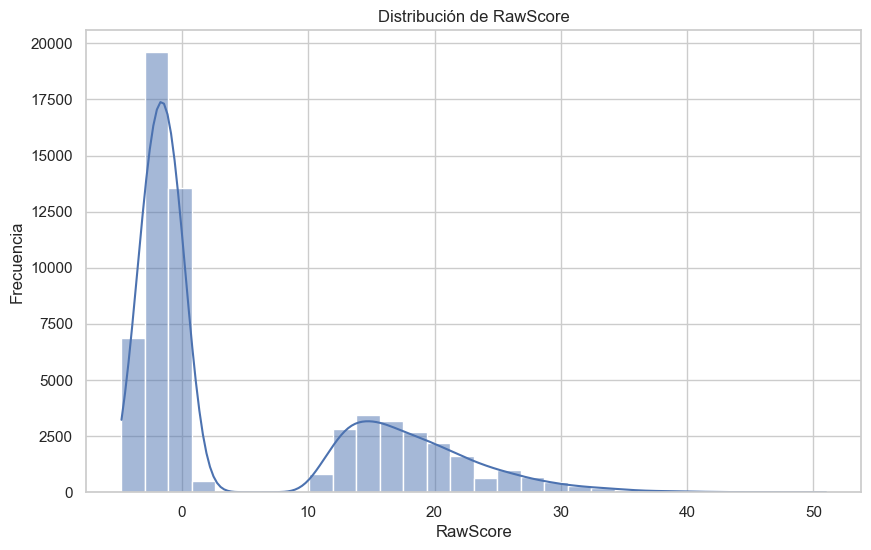

c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



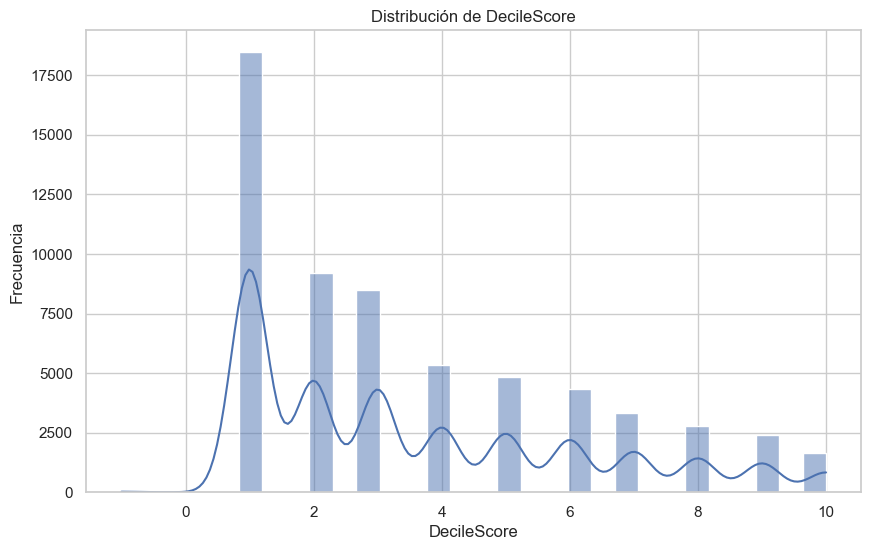

c:\Users\USUARIO\Ivan\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



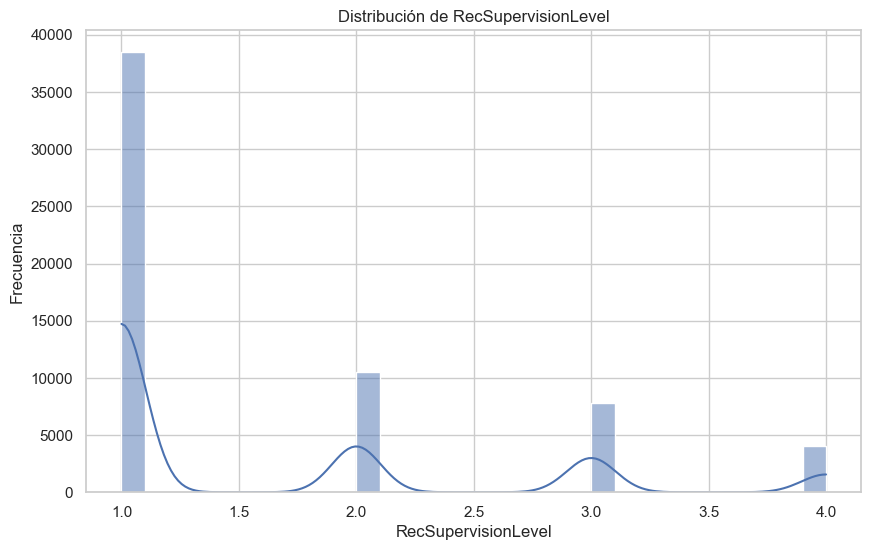

In [22]:

# Resumen estadístico general del dataset
print("Resumen estadístico general del dataset:")
print(df_compas_raw.describe(include='all'))

# Variables categóricas (frecuencias)
categorical_columns = [
    'Sex_Code_Text', 'Ethnic_Code_Text', 'AssessmentReason', 
    'RecSupervisionLevelText', 'ScoreText', 'AssessmentType', 
    'IsCompleted', 'IsDeleted'
]
for column in categorical_columns:
    print(f'\nFrecuencia de {column}:')
    print(df_compas_raw[column].value_counts())

# Variables numéricas (distribuciones)
numeric_columns = ['RawScore', 'DecileScore', 'RecSupervisionLevel']
for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_compas_raw[column], kde=True, bins=30)
    plt.title(f'Distribución de {column}')
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
    plt.show()


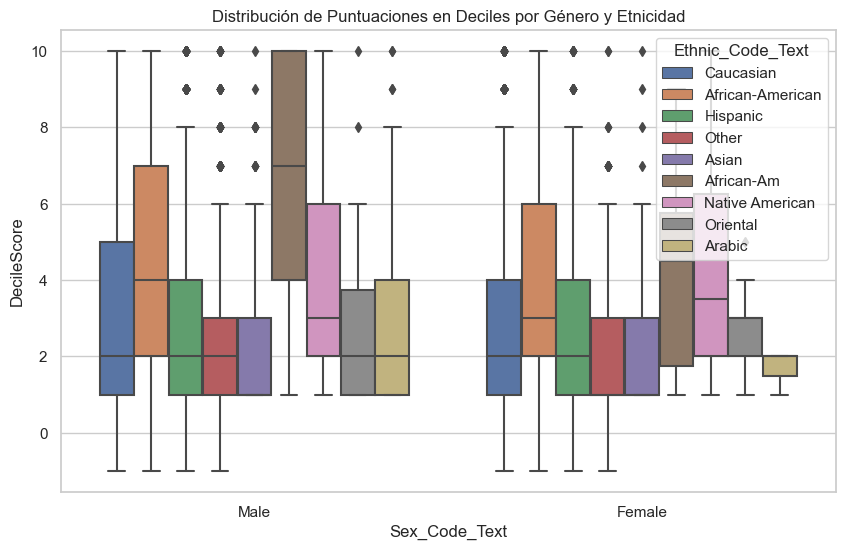

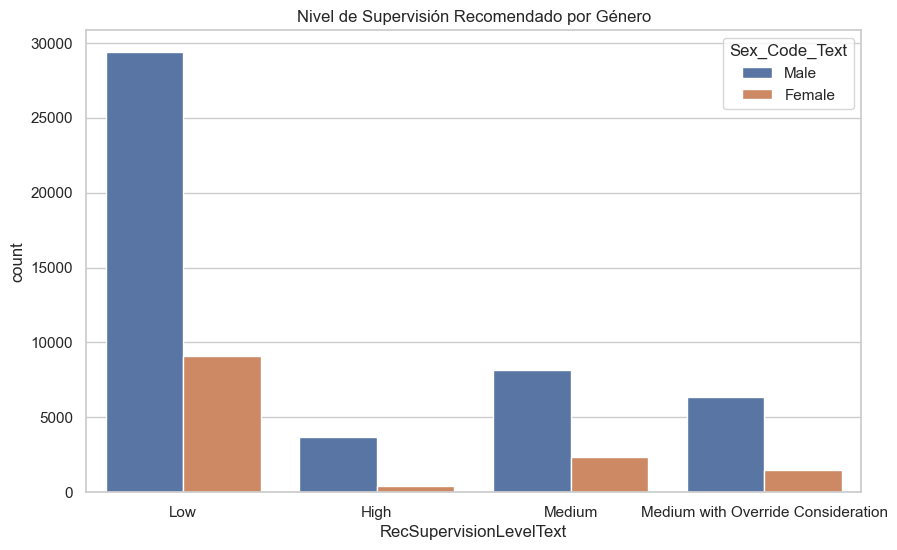

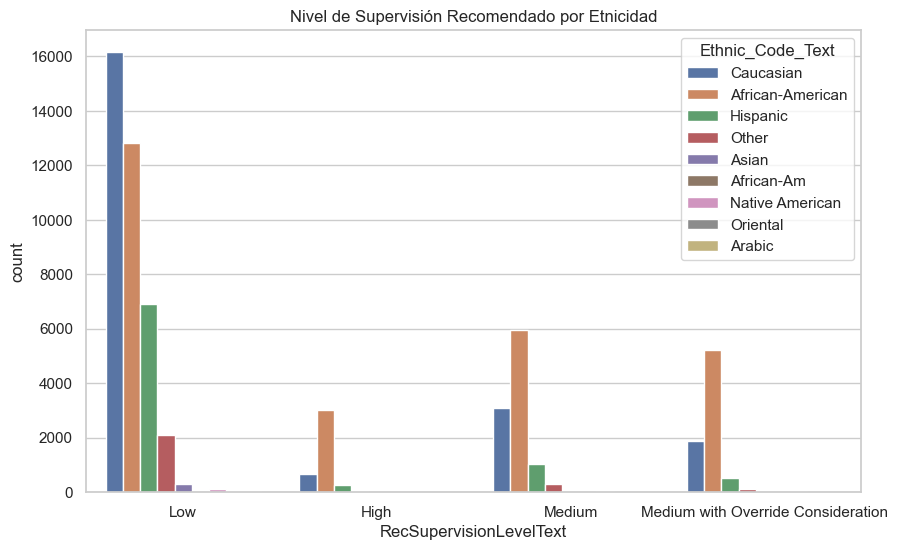


Distribución de Nivel de Supervisión Recomendado por Género:
Sex_Code_Text                          Female       Male
RecSupervisionLevelText                                 
High                                 9.882006  90.117994
Low                                 23.619775  76.380225
Medium                              22.365407  77.634593
Medium with Override Consideration  19.126102  80.873898

Distribución de Nivel de Supervisión Recomendado por Etnicidad:
Ethnic_Code_Text                    African-Am  African-American    Arabic  \
RecSupervisionLevelText                                                      
High                                  0.442478         74.041298  0.073746   
Low                                   0.031192         33.320337  0.132564   
Medium                                0.057274         56.987400  0.143184   
Medium with Override Consideration    0.191644         66.653890  0.076658   

Ethnic_Code_Text                       Asian  Caucasian   Hisp

In [23]:


# Configuración de estilo de Seaborn
sns.set(style="whitegrid")

# Distribución de puntuaciones en deciles por género y etnicidad
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sex_Code_Text', y='DecileScore', hue='Ethnic_Code_Text', data=df_compas_raw)
plt.title('Distribución de Puntuaciones en Deciles por Género y Etnicidad')
plt.show()

# Nivel de supervisión recomendado por género
plt.figure(figsize=(10, 6))
sns.countplot(x='RecSupervisionLevelText', hue='Sex_Code_Text', data=df_compas_raw)
plt.title('Nivel de Supervisión Recomendado por Género')
plt.show()

# Nivel de supervisión recomendado por etnicidad
plt.figure(figsize=(10, 6))
sns.countplot(x='RecSupervisionLevelText', hue='Ethnic_Code_Text', data=df_compas_raw)
plt.title('Nivel de Supervisión Recomendado por Etnicidad')
plt.show()

# Mostrar los porcentajes de distribución para RecSupervisionLevelText por género
supervision_gender_counts = df_compas_raw.groupby('RecSupervisionLevelText')['Sex_Code_Text'].value_counts(normalize=True).unstack().fillna(0) * 100
print("\nDistribución de Nivel de Supervisión Recomendado por Género:")
print(supervision_gender_counts)

# Mostrar los porcentajes de distribución para RecSupervisionLevelText por etnicidad
supervision_ethnicity_counts = df_compas_raw.groupby('RecSupervisionLevelText')['Ethnic_Code_Text'].value_counts(normalize=True).unstack().fillna(0) * 100
print("\nDistribución de Nivel de Supervisión Recomendado por Etnicidad:")
print(supervision_ethnicity_counts)
